In [51]:
image_name="out_image.png"

function used to visulise the images at intermediate steps

In [52]:
import pandas as pd
import numpy as np
from PIL import Image
import math
from IPython.display import display

def rgb_series_to_image(red_series, green_series, blue_series, output_path="output_image.png"):
    
    # Convert to numpy arrays (ensure uint8)
    r = red_series.to_numpy(dtype=np.uint8)
    g = green_series.to_numpy(dtype=np.uint8)
    b = blue_series.to_numpy(dtype=np.uint8)

    # Stack into (N, 3)
    pixels = np.stack((r, g, b), axis=1)

    # Number of pixels
    N = len(pixels)

    # Find dimensions (square preferred)
    width = int(math.sqrt(N))
    height = N // width

    if width * height != N:
        raise ValueError(f"Pixel count {N} does not fit perfectly into {width}x{height} image.")

    # Reshape to image format
    pixels = pixels.reshape((height, width, 3))

    # Create and save image
    img = Image.fromarray(pixels, 'RGB')
    img.save(output_path)
    # img.show()

    print(f"Image saved as {output_path}")
    display(img)



Picture Loading

In [53]:
import cv2 
img = cv2.imread(image_name)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
img

(88, 88, 3)


array([[[  0,   0,   0],
        [ 10,  10,  10],
        [ 39,  39,  39],
        ...,
        [ 59,  59,  59],
        [ 57,  57,  57],
        [ 53,  53,  53]],

       [[  0,   0,   0],
        [  8,   8,   8],
        [ 35,  35,  35],
        ...,
        [ 56,  56,  56],
        [ 57,  57,  57],
        [ 57,  57,  57]],

       [[  0,   0,   0],
        [ 10,  10,  10],
        [ 35,  35,  35],
        ...,
        [ 55,  55,  55],
        [ 55,  55,  55],
        [ 54,  54,  54]],

       ...,

       [[199, 199, 199],
        [240, 240, 240],
        [255, 255, 255],
        ...,
        [ 53,  53,  53],
        [ 51,  51,  51],
        [ 45,  45,  45]],

       [[184, 184, 184],
        [235, 235, 235],
        [255, 255, 255],
        ...,
        [ 52,  52,  52],
        [ 50,  50,  50],
        [ 47,  47,  47]],

       [[163, 163, 163],
        [224, 224, 224],
        [255, 255, 255],
        ...,
        [ 57,  57,  57],
        [ 57,  57,  57],
        [ 57,  57,  57]]

In [54]:
img_rows=img.shape[0]
img_columns=img.shape[1]
total_pixels=img_rows*img_columns
print(img[img.shape[0]-1][img.shape[1]-1])
print(img[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in img matrix
    for column in range(img_columns):#columns in img matrix
        red_values.append(img[row][column][0])#Red value of Pixel
        green_values.append(img[row][column][1])#Green value of Pixel
        blue_values.append(img[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
picture_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
picture_df

[57 57 57]
[57 57 57]
No. of Rows in the Img Matrix : 88
No. of Columns in Img matrix : 88
Total No. of Pixels in Img : 7744
7744
7744
7744


,Red,Green,Blue
0,0,0,0
1,10,10,10
2,39,39,39
3,48,48,48
4,47,47,47
...,...,...,...
7739,56,56,56
7740,57,57,57
7741,57,57,57
7742,57,57,57


Redraw the image from extrated data to check the data extration quality

Image saved as extracted_img.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



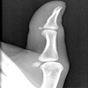

In [56]:
rgb_series_to_image(picture_df['Red'],picture_df['Green'],picture_df['Blue'],output_path="extracted_img.png")

Creating Logistic Map

In [57]:
import math
def intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3):
    x_n_plus_1=(mue*k1*y_n*(1-x_n)+z_n)%1
    y_n_plus_1=(mue*k2*y_n + z_n*(1+(x_n_plus_1)**2))%1
    z_n_plus_1=(mue*(y_n_plus_1+x_n_plus_1+k3)*math.sin(z_n))%1
    return x_n_plus_1, y_n_plus_1, z_n_plus_1

In [58]:
#initial parameters (have exact values as referred in the paper see fig 1a in JISA paper)
x_n = 0.361
y_n=0.259
z_n= 0.785
#constants used in the given equation 
mue=3.999
k1=34.913
k2=38.942
k3=36.709

#initial parameters (have exact values as referred in the paper see fig 1a in JISA paper)
x_n_2 = 0.353
y_n_2 =0.278
z_n_2 = 0.756
#constants used in the given equation 
# mue=3.999
# k1=34.913
# k2=38.942
# k3=36.709

In [59]:
steps=[]; x_values=[] ; y_values= []; z_values = [] 

for i in range((img_rows*img_columns)+ 10000):#initial 10000 iterations are transient iterations (its values are not used)
    #store current values (Keystream)
    if(i<10000):
        continue
    steps.append(i)
    x_values.append(x_n)
    y_values.append(y_n)
    z_values.append(z_n)
    #update keystream
    x_n_plus_1 , y_n_plus_1 , z_n_plus_1 = intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3)
    x_n=x_n_plus_1
    y_n=y_n_plus_1
    z_n=z_n_plus_1
#dataframe creation
import pandas as pd
logistic_map_df=pd.DataFrame()
logistic_map_df["Steps"]=steps
logistic_map_df["X"]=x_values
logistic_map_df["Y"]=y_values
logistic_map_df["Z"]=z_values

print(logistic_map_df["X"].max())
print(logistic_map_df["Y"].max())
print(logistic_map_df["Z"].max())
print(logistic_map_df["X"].min())
print(logistic_map_df["Y"].min())
print(logistic_map_df["Z"].min())
logistic_map_df

0.9999500084923696
0.9999464846033206
0.9998946894031064
0.0001903313549238561
0.00023092870618768302
2.8339175358382818e-05


,Steps,X,Y,Z
0,10000,0.361000,0.259000,0.785000
1,10001,0.891768,0.743097,0.382533
2,10002,0.611545,0.247348,0.078047
3,10003,0.492953,0.616256,0.791442
4,10004,0.417638,0.898408,0.172082
...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928
7740,17740,0.932606,0.303221,0.687324
7741,17741,0.540453,0.108469,0.786355
7742,17742,0.745769,0.115407,0.339577


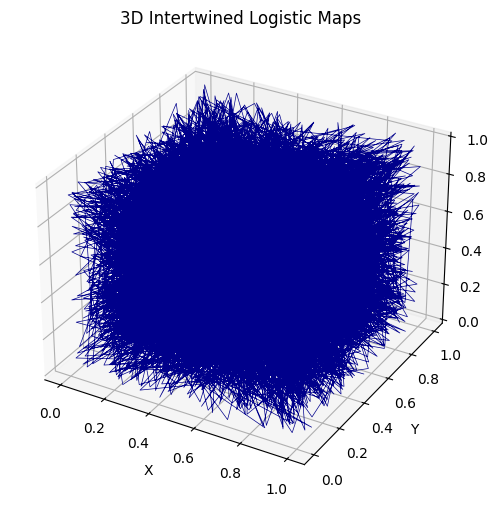

In [60]:
import numpy as np
import matplotlib.pyplot as plt
# Plot in 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(logistic_map_df['X'], logistic_map_df['Y'] , logistic_map_df["Z"], color='darkblue', lw=0.5)

ax.set_title("3D Intertwined Logistic Maps")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.show()


In [61]:
# import numpy as np
# import plotly.express as px
# import pandas as pd
# # Create dataframe for Plotly Express
# plot_df = pd.DataFrame({"X": logistic_map_df['X'], "Y": logistic_map_df['Y'], "Z": logistic_map_df['Z'], "Step": logistic_map_df['Steps']})

# # Interactive 3D scatter plot with continuous color
# fig = px.scatter_3d(plot_df, x="X", y="Y", z="Z", color="Step",
#                     color_continuous_scale="Viridis",
#                     title="3D Intertwined Logistic Maps (Interactive)",
#                     size_max=2)
# fig.show()


In [62]:
#Note all values from the itertwined logistic maps are btw [0,1]
# All logistic values are scalled to be in btw [0,255] 
logistic_map_df['X_Scalled'] = (logistic_map_df['X'] * 255).round().astype(int)
logistic_map_df['Y_Scalled'] = (logistic_map_df["Y"] * 255).round().astype(int)
logistic_map_df['Z_Scalled'] = (logistic_map_df["Z"] * 255).round().astype(int)

print(logistic_map_df['X_Scalled'].max())
print(logistic_map_df['Y_Scalled'].max())
print(logistic_map_df['Z_Scalled'].max())
print(logistic_map_df['X_Scalled'].min())
print(logistic_map_df['Y_Scalled'].min())
print(logistic_map_df['Z_Scalled'].min())
logistic_map_df


255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled
0,10000,0.361000,0.259000,0.785000,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44
...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206
7740,17740,0.932606,0.303221,0.687324,238,77,175
7741,17741,0.540453,0.108469,0.786355,138,28,201
7742,17742,0.745769,0.115407,0.339577,190,29,87


Adding Picture Data in Logistic map df 

In [63]:
logistic_map_df['Red']=picture_df['Red']
logistic_map_df['Green']=picture_df['Green']
logistic_map_df['Blue']=picture_df['Blue']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47
...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57


Mixing Starts here

In [64]:
#bitwise Xor
logistic_map_df['Xor_Red']=logistic_map_df['X_Scalled']^logistic_map_df['Red']
logistic_map_df['Xor_Green']=logistic_map_df['Y_Scalled']^logistic_map_df['Green']
logistic_map_df['Xor_Blue']=logistic_map_df['Z_Scalled']^logistic_map_df['Blue']

print(logistic_map_df['Xor_Red'].max())
print(logistic_map_df['Xor_Green'].max())
print(logistic_map_df['Xor_Blue'].max())
print(logistic_map_df['Xor_Red'].min())
print(logistic_map_df['Xor_Green'].min())
print(logistic_map_df['Xor_Blue'].min())
logistic_map_df

255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,233,183,104
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,187,24,51
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,78,173,250
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,69,202,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,106,51,246
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,215,116,150
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,179,37,240
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,135,36,110


Xored Image checking

Image saved as 3d-intertwined.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



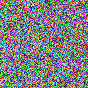

In [65]:
rgb_series_to_image(logistic_map_df['Xor_Red'],logistic_map_df['Xor_Green'],logistic_map_df['Xor_Blue'],output_path="3d-intertwined.png")

Bitwise xor is reversel i.e. (A^K^)k=A using this trying a simple decryption 

In [66]:
logistic_map_df["XOR_reversed_Red"]=logistic_map_df['Xor_Red']^logistic_map_df['X_Scalled']
logistic_map_df["XOR_reversed_Green"]=logistic_map_df['Xor_Green']^logistic_map_df['Y_Scalled']
logistic_map_df["XOR_reversed_Blue"]=logistic_map_df['Xor_Blue']^logistic_map_df['Z_Scalled']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,233,183,104,10,10,10
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,187,24,51,39,39,39
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,78,173,250,48,48,48
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,69,202,3,47,47,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,106,51,246,56,56,56
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,215,116,150,57,57,57
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,179,37,240,57,57,57
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,135,36,110,57,57,57


Xored Image matrix

In [67]:
import math 
import numpy as np 
xor_red_values=list(logistic_map_df["Xor_Red"])
xor_green_values=list(logistic_map_df['Xor_Green'])
xor_blue_values=list(logistic_map_df['Xor_Blue'])
print(len(xor_red_values))
print(len(xor_green_values))
print(len(xor_blue_values))
size = int(math.sqrt(len(xor_red_values)))
print(size)

simple_xored_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(simple_xored_cipher_matrix.shape)
simple_xored_cipher_matrix

for i in range(len(xor_red_values)):
    row=int(i/size)
    col=i%size
    # print(f"row: {row} , col: {col} , {simple_xored_cipher_matrix[row][col]}")#use this line to check only 
    simple_xored_cipher_matrix[row][col][0]=xor_red_values[i]
    simple_xored_cipher_matrix[row][col][1]=xor_green_values[i]
    simple_xored_cipher_matrix[row][col][2]=xor_blue_values[i]
print(simple_xored_cipher_matrix.shape)
img = Image.fromarray(simple_xored_cipher_matrix, 'RGB')
img.show()
simple_xored_cipher_matrix

7744
7744
7744
88
(88, 88, 3)
(88, 88, 3)


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\3348461487.py:24: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



array([[[ 92,  66, 200],
        [233, 183, 104],
        [187,  24,  51],
        ...,
        [173, 235, 188],
        [187, 185,  48],
        [ 96, 112,  78]],

       [[146, 134,  93],
        [188, 143,  77],
        [ 10, 192,  29],
        ...,
        [ 35,  76, 188],
        [ 40,  10,  92],
        [116,  87, 227]],

       [[246,  15, 214],
        [ 17, 219, 214],
        [242, 198, 196],
        ...,
        [130,  71, 116],
        [ 51,  88, 224],
        [198, 150,  17]],

       ...,

       [[149,  99,  13],
        [ 57, 129,   3],
        [220, 253, 208],
        ...,
        [152, 128, 192],
        [249, 106,  52],
        [ 12, 106, 242]],

       [[199, 248,  72],
        [154,  27, 207],
        [181,  26, 186],
        ...,
        [190, 238, 177],
        [ 87, 129, 103],
        [183, 244, 148]],

       [[234,   7,  53],
        [ 29, 124,  48],
        [115, 210,  35],
        ...,
        [179,  37, 240],
        [135,  36, 110],
        [ 86,  89, 195]]

I want to use a better random map, in shuffling replacement need in shuffling


1-D Chaotic matrix (used in shuffling)

In [68]:
def chaotic_function(x_n,r=3.9):
    ''' The function is a simulation of chatoic behaviour 
        based on equation  x_n+1 = r * x_n * (1 - x_n)
        where each new_value(x_n+1) is based on old_value(x_n) with a seed vaue r 
    '''
    '''Arguments 
        x_n (previous value and seed value)
        r=custom chatoic constant
    '''
    return r*x_n*(1-x_n)

my_values=[] ; iterations=[]
r=3.9
x_n =0.5
simple_xored_cipher_matrix_total_size=int(simple_xored_cipher_matrix.shape[0]*simple_xored_cipher_matrix.shape[1])
print("simple_xored_cipher_matrix_total_size ",simple_xored_cipher_matrix_total_size)
for i in range(simple_xored_cipher_matrix_total_size+10000):#100 iterations
    if(i<10000):#transient iterations
        continue
    my_values.append(x_n)
    x_n_1 = chaotic_function(x_n,r)
    x_n=x_n_1
    iterations.append(i)
chaotic_df=pd.DataFrame({"iteration":iterations,"value":my_values})

import plotly.express as px
fig = px.scatter(
    chaotic_df,
    x="iteration",
    y="value",
    color="value",
    title="Chaotic 1D Logistic Map",
    size_max=2
)
# fig.show()
print(chaotic_df)

chaotic_matrix_size=int(math.sqrt(len(my_values)))
chaotic_matrix=np.zeros((chaotic_matrix_size,chaotic_matrix_size,3)) # 1st the chaos value 2nd is original row and 3rd original col
chaotic_matrix

for i in range(len(my_values)):
    row=int(i/chaotic_matrix_size)
    col=i%chaotic_matrix_size

    chaotic_matrix[row][col]=my_values[i]#chaos value
    chaotic_matrix[row][col][1]=row#original row
    chaotic_matrix[row][col][2]=col#original col
print(chaotic_matrix.shape)
chaotic_matrix

simple_xored_cipher_matrix_total_size  7744
      iteration     value
0         10000  0.500000
1         10001  0.975000
2         10002  0.095063
3         10003  0.335500
4         10004  0.869465
...         ...       ...
7739      17739  0.511702
7740      17740  0.974466
7741      17741  0.097040
7742      17742  0.341731
7743      17743  0.877308

[7744 rows x 2 columns]
(88, 88, 3)


array([[[ 0.5       ,  0.        ,  0.        ],
        [ 0.975     ,  0.        ,  1.        ],
        [ 0.0950625 ,  0.        ,  2.        ],
        ...,
        [ 0.85063057,  0.        , 85.        ],
        [ 0.49552698,  0.        , 86.        ],
        [ 0.97492197,  0.        , 87.        ]],

       [[ 0.09535158,  1.        ,  0.        ],
        [ 0.33641266,  1.        ,  1.        ],
        [ 0.87063281,  1.        ,  2.        ],
        ...,
        [ 0.90181291,  1.        , 85.        ],
        [ 0.3453309 ,  1.        , 86.        ],
        [ 0.88170214,  1.        , 87.        ]],

       [[ 0.40678357,  2.        ,  0.        ],
        [ 0.94111172,  2.        ,  1.        ],
        [ 0.21613976,  2.        ,  2.        ],
        ...,
        [ 0.82109321,  2.        , 85.        ],
        [ 0.57290668,  2.        , 86.        ],
        [ 0.95427   ,  2.        , 87.        ]],

       ...,

       [[ 0.42791881, 85.        ,  0.        ],
        [ 0

Column Shuffling

column-wise sorted chaotic matrix

In [69]:
sort_idx = np.argsort(chaotic_matrix[:, :, 0], axis=0)
# Column indices for broadcasting
cols = np.arange(chaotic_matrix.shape[1])
# Apply sorting so all 3 channels follow the first channel's order
column_shuffling_sorted_indices = chaotic_matrix[sort_idx, cols]
print(column_shuffling_sorted_indices.shape)
column_shuffling_sorted_indices

(88, 88, 3)


array([[[ 0.09535158,  1.        ,  0.        ],
        [ 0.0952068 , 40.        ,  1.        ],
        [ 0.0950625 ,  0.        ,  2.        ],
        ...,
        [ 0.0951902 , 45.        , 85.        ],
        [ 0.09545112, 33.        , 86.        ],
        [ 0.09513463, 21.        , 87.        ]],

       [[ 0.09603456, 45.        ,  0.        ],
        [ 0.09546531, 55.        ,  1.        ],
        [ 0.09506309, 28.        ,  2.        ],
        ...,
        [ 0.09633118, 84.        , 85.        ],
        [ 0.10334437, 52.        , 86.        ],
        [ 0.0951878 , 73.        , 87.        ]],

       [[ 0.09634294, 69.        ,  0.        ],
        [ 0.09556822, 63.        ,  1.        ],
        [ 0.09882993, 37.        ,  2.        ],
        ...,
        [ 0.09666052, 59.        , 85.        ],
        [ 0.10395971, 37.        , 86.        ],
        [ 0.095314  ,  7.        , 87.        ]],

       ...,

       [[ 0.97486349, 63.        ,  0.        ],
        [ 0

In [70]:
column_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(column_shuffled_cipher_matrix.shape)
print(column_shuffled_cipher_matrix)
#column shuffling
for row in range(column_shuffling_sorted_indices.shape[0]):
    for col in range(column_shuffling_sorted_indices.shape[1]):
        # column_shuffling_sorted_indices[row][col]
        original_row=int(column_shuffling_sorted_indices[row][col][1])
        changed_row=row
        print(f"original_row: {original_row}, changed_row: {changed_row}, col = {col}")
        #col will be same in column -wise shuffiling since we have sorted the chaotix mtarix column-wise
        column_shuffled_cipher_matrix[changed_row][col]=simple_xored_cipher_matrix[original_row][col]
        
print(column_shuffled_cipher_matrix.shape)
print(column_shuffled_cipher_matrix)
img = Image.fromarray(column_shuffled_cipher_matrix, 'RGB')
img.show()
output_path=image_name.split(".")[0]+"_Column_shuffled_cipher_image.png"
img.save(output_path)

(88, 88, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
original_row: 1, changed_row: 0, col = 0
original_row: 40, changed_row: 0, col = 1
original_row: 0, changed_row: 0, col = 2
original_row: 47, changed_row: 0, col = 3
original_row: 59, changed_row: 0, col = 4
original_row: 6, changed_row: 0, col = 5
original_row: 4, changed_row: 0, col = 6
original_row: 35, changed_row: 0, col = 7
original_row: 58, changed_row: 0, col = 8
original_row: 63, changed_row: 0, col = 9
original_row: 25, changed_row: 0, col = 10
original_row: 14, changed_row: 0, col = 11
original_row: 33, changed_row: 0, col = 12
original_row: 12, changed_row

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2956648526.py:16: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



save Column Shuffled data

In [71]:
print(column_shuffled_cipher_matrix.shape)

img_rows=column_shuffled_cipher_matrix.shape[0]
img_columns=column_shuffled_cipher_matrix.shape[1]
total_pixels=img_rows*img_columns
print(column_shuffled_cipher_matrix[column_shuffled_cipher_matrix.shape[0]-1][column_shuffled_cipher_matrix.shape[1]-1])
print(column_shuffled_cipher_matrix[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in column_shuffled_cipher_matrix matrix
    for column in range(img_columns):#columns in column_shuffled_cipher_matrix matrix
        red_values.append(column_shuffled_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(column_shuffled_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(column_shuffled_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
column_shuffled_cipher_matrix_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
column_shuffled_cipher_matrix_df

(88, 88, 3)
[ 96 112  78]
[ 96 112  78]
No. of Rows in the Img Matrix : 88
No. of Columns in Img matrix : 88
Total No. of Pixels in Img : 7744
7744
7744
7744


,Red,Green,Blue
0,146,134,93
1,242,139,116
2,187,24,51
3,94,121,163
4,102,175,139
...,...,...,...
7739,85,220,51
7740,115,2,104
7741,22,144,136
7742,151,77,224


In [72]:
logistic_map_df["Column_shuffled_Red"]=column_shuffled_cipher_matrix_df["Red"]
logistic_map_df["Column_shuffled_Green"]=column_shuffled_cipher_matrix_df["Green"]
logistic_map_df["Column_shuffled_Blue"]=column_shuffled_cipher_matrix_df["Blue"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200,0,0,0,146,134,93
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,233,183,104,10,10,10,242,139,116
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,187,24,51,39,39,39,187,24,51
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,78,173,250,48,48,48,94,121,163
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,69,202,3,47,47,47,102,175,139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,106,51,246,56,56,56,85,220,51
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,215,116,150,57,57,57,115,2,104
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,179,37,240,57,57,57,22,144,136
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,135,36,110,57,57,57,151,77,224


Image saved as column_shuflled.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



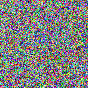

In [73]:
rgb_series_to_image(logistic_map_df['Column_shuffled_Red'],logistic_map_df['Column_shuffled_Green'],logistic_map_df['Column_shuffled_Blue'],output_path="column_shuflled.png")

Row Shuffling

row-wise shuffling chaotic matrix

In [74]:
# Get sorting indices from the first channel for each row
sort_idx = np.argsort(chaotic_matrix[:, :, 0], axis=1)
# Row indices for broadcasting
rows = np.arange(chaotic_matrix.shape[0])[:, None]
# Apply sorting so all 3 channels follow the first channel's order
row_shuffling_sorted_indices = chaotic_matrix[rows, sort_idx]
print(row_shuffling_sorted_indices.shape)
row_shuffling_sorted_indices

(88, 88, 3)


array([[[ 0.0950625 ,  0.        ,  2.        ],
        [ 0.09905036,  0.        , 45.        ],
        [ 0.10174757,  0.        , 69.        ],
        ...,
        [ 0.97392243,  0.        , 44.        ],
        [ 0.97492197,  0.        , 87.        ],
        [ 0.975     ,  0.        ,  1.        ]],

       [[ 0.09535158,  1.        ,  0.        ],
        [ 0.09634765,  1.        ,  8.        ],
        [ 0.09699909,  1.        , 33.        ],
        ...,
        [ 0.97363684,  1.        , 21.        ],
        [ 0.97447702,  1.        , 32.        ],
        [ 0.974653  ,  1.        ,  7.        ]],

       [[ 0.10202813,  2.        , 20.        ],
        [ 0.10264188,  2.        , 52.        ],
        [ 0.12010112,  2.        , 10.        ],
        ...,
        [ 0.96819317,  2.        ,  9.        ],
        [ 0.97294986,  2.        , 51.        ],
        [ 0.9731162 ,  2.        , 19.        ]],

       ...,

       [[ 0.09645362, 85.        , 72.        ],
        [ 0

In [75]:
row_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(row_shuffled_cipher_matrix.shape)
print(row_shuffled_cipher_matrix)
#row shuffling
for row in range(row_shuffling_sorted_indices.shape[0]):
    for col in range(row_shuffling_sorted_indices.shape[1]):
        original_col = int(row_shuffling_sorted_indices[row][col][2])
        changed_col=col
        print(f"original_col: {original_col}, changed_col: {changed_col}, row = {row}")
        #row will be same in row-wise shuffiling since we have sorted the chaotic mtarix row-wise
        row_shuffled_cipher_matrix[row][changed_col]=column_shuffled_cipher_matrix[row][original_col]
print(row_shuffled_cipher_matrix.shape)
print(row_shuffled_cipher_matrix)
img = Image.fromarray(row_shuffled_cipher_matrix, 'RGB')
img.show()
output_path=image_name.split(".")[0]+"_Row_shuffled_cipher_image.png"
img.save(output_path)

(88, 88, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
original_col: 2, changed_col: 0, row = 0
original_col: 45, changed_col: 1, row = 0
original_col: 69, changed_col: 2, row = 0
original_col: 31, changed_col: 3, row = 0
original_col: 10, changed_col: 4, row = 0
original_col: 24, changed_col: 5, row = 0
original_col: 78, changed_col: 6, row = 0
original_col: 59, changed_col: 7, row = 0
original_col: 7, changed_col: 8, row = 0
original_col: 42, changed_col: 9, row = 0
original_col: 62, changed_col: 10, row = 0
original_col: 17, changed_col: 11, row = 0
original_col: 50, changed_col: 12, row = 0
original_col: 81, changed_c

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\559326577.py:14: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



save Row shuffled Cipher Matrix

In [76]:
print(row_shuffled_cipher_matrix.shape)

img_rows=row_shuffled_cipher_matrix.shape[0]
img_columns=row_shuffled_cipher_matrix.shape[1]
total_pixels=img_rows*img_columns
print(row_shuffled_cipher_matrix[row_shuffled_cipher_matrix.shape[0]-1][row_shuffled_cipher_matrix.shape[1]-1])
print(row_shuffled_cipher_matrix[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in row_shuffled_cipher_matrix matrix
    for column in range(img_columns):#columns in row_shuffled_cipher_matrix matrix
        red_values.append(row_shuffled_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(row_shuffled_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(row_shuffled_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
row_shuffled_cipher_matrix_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
row_shuffled_cipher_matrix_df

(88, 88, 3)
[ 24 202 233]
[ 24 202 233]
No. of Rows in the Img Matrix : 88
No. of Columns in Img matrix : 88
Total No. of Pixels in Img : 7744
7744
7744
7744


,Red,Green,Blue
0,187,24,51
1,176,99,104
2,6,194,19
3,53,205,55
4,8,217,220
...,...,...,...
7739,110,160,97
7740,220,207,172
7741,96,240,215
7742,115,2,104


In [77]:
logistic_map_df["Row_&_column_shuffled_Red"]=row_shuffled_cipher_matrix_df["Red"]
logistic_map_df["Row_&_column_shuffled_Green"]=row_shuffled_cipher_matrix_df["Green"]
logistic_map_df["Row_&_column_shuffled_Blue"]=row_shuffled_cipher_matrix_df["Blue"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,200,0,0,0,146,134,93,187,24,51
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,104,10,10,10,242,139,116,176,99,104
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,51,39,39,39,187,24,51,6,194,19
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,250,48,48,48,94,121,163,53,205,55
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,3,47,47,47,102,175,139,8,217,220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,246,56,56,56,85,220,51,110,160,97
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,150,57,57,57,115,2,104,220,207,172
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,240,57,57,57,22,144,136,96,240,215
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,110,57,57,57,151,77,224,115,2,104


Image saved as row_shuffled.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



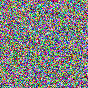

In [78]:
rgb_series_to_image(logistic_map_df['Row_&_column_shuffled_Red'],logistic_map_df['Row_&_column_shuffled_Green'],logistic_map_df['Row_&_column_shuffled_Blue'],output_path="row_shuffled.png")

Confusion Starts here

Ci+1 = Ci−1   XOR   Ki    XOR   Ci    XOR   ILMi        ((((((((((eq 17 in JISA paper

Ci and Ci-1 (Note C-1=0)

In [79]:
# ci_minus_1_red = list(logistic_map_df["Row_&_column_shuffled_Red"])
# print(len(ci_minus_1_red))
# print(ci_minus_1_red[0])
# print(ci_minus_1_red[-1])
# print("")
# ci_minus_1_red.insert(0,0)
# ci_minus_1_red=ci_minus_1_red[:-1]
# print(len(ci_minus_1_red))
# print(ci_minus_1_red[0])
# print(ci_minus_1_red[1])
# print(ci_minus_1_red[-1])
# # ci_minus_1_red
# print("others")
# ci_minus_1_green = list(logistic_map_df["Row_&_column_shuffled_Green"])
# ci_minus_1_green.insert(0,0)
# ci_minus_1_green=ci_minus_1_green[:-1]
# # ci_minus_1_green
# ci_minus_1_blue = list(logistic_map_df["Row_&_column_shuffled_Blue"])
# ci_minus_1_blue.insert(0,0)
# ci_minus_1_blue=ci_minus_1_blue[:-1]
# # ci_minus_1_blue

# logistic_map_df["ci_minus_1_red"]=ci_minus_1_red
# logistic_map_df["ci_minus_1_green"]=ci_minus_1_green
# logistic_map_df["ci_minus_1_blue"]=ci_minus_1_blue
# logistic_map_df

In [80]:
# logistic_map_df.iloc[-5:-1][:]

ki
--Note : Currently we are usinng 1D chaotic matrix which was creted when used in shuffling 
--Although we can, and will try to make another chaos matrix for more security

In [81]:
# chaotic_df['value_Scalled'] = (chaotic_df['value'] * 255).round().astype(int)
# print(chaotic_df['value_Scalled'].max())
# print(chaotic_df['value'].max())
# print(chaotic_df['value'].max()*255)
# chaotic_df

In [82]:
# logistic_map_df["ki"]=np.array(chaotic_df["value_Scalled"])
# logistic_map_df

XOR for Confusion

Ci+1 = Ci−1   XOR   Ki    XOR   Ci    XOR   ILMi

In [83]:
# logistic_map_df["Cipher_Red_Confused"]=logistic_map_df["ci_minus_1_red"]^logistic_map_df["ki"]^logistic_map_df['Row_&_column_shuffled_Red']^logistic_map_df["X_Scalled"]
# logistic_map_df["Cipher_Green_Confused"]=logistic_map_df['ci_minus_1_green']^logistic_map_df["ki"]^logistic_map_df['Row_&_column_shuffled_Green']^logistic_map_df["Y_Scalled"]
# logistic_map_df["Cipher_Blue_Confused"]=logistic_map_df['ci_minus_1_blue']^logistic_map_df["ki"]^logistic_map_df["Row_&_column_shuffled_Blue"]^logistic_map_df["Z_Scalled"]
# logistic_map_df

In [84]:
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,200,0,0,0,146,134,93,187,24,51
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,104,10,10,10,242,139,116,176,99,104
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,51,39,39,39,187,24,51,6,194,19
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,250,48,48,48,94,121,163,53,205,55
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,3,47,47,47,102,175,139,8,217,220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,246,56,56,56,85,220,51,110,160,97
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,150,57,57,57,115,2,104,220,207,172
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,240,57,57,57,22,144,136,96,240,215
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,110,57,57,57,151,77,224,115,2,104


In [85]:
steps=[]; x_values=[] ; y_values= []; z_values = [] 

for i in range((img_rows*img_columns)+ 10000):#initial 10000 iterations are transient iterations (its values are not used)
    #store current values (Keystream)
    if(i<10000):
        continue
    steps.append(i)
    x_values.append(x_n_2)
    y_values.append(y_n_2)
    z_values.append(z_n_2)
    #update keystream
    x_n_plus_1 , y_n_plus_1 , z_n_plus_1 = intertwin_3d_iterator(x_n_2,y_n_2,z_n_2,mue,k1,k2,k3)
    x_n_2=x_n_plus_1
    y_n_2=y_n_plus_1
    z_n_2=z_n_plus_1
#dataframe creation
import pandas as pd
logistic_map_df_2=pd.DataFrame()
logistic_map_df_2["Steps"]=steps
logistic_map_df_2["X"]=x_values
logistic_map_df_2["Y"]=y_values
logistic_map_df_2["Z"]=z_values

print(logistic_map_df_2["X"].max())
print(logistic_map_df_2["Y"].max())
print(logistic_map_df_2["Z"].max())
print(logistic_map_df_2["X"].min())
print(logistic_map_df_2["Y"].min())
print(logistic_map_df_2["Z"].min())
logistic_map_df_2

0.9999819974228004
0.9998841435482504
0.9999679595286324
4.8699795366147214e-05
0.00011317626402274072
5.9821778478408305e-05


,Steps,X,Y,Z
0,10000,0.353000,0.278000,0.756000
1,10001,0.868367,0.618748,0.786473
2,10002,0.157967,0.163202,0.823459
3,10003,0.009853,0.238852,0.407006
4,10004,0.426310,0.677224,0.859151
...,...,...,...,...
7739,17739,0.251231,0.562097,0.866579
7740,17740,0.628756,0.744076,0.062430
7741,17741,0.629426,0.961441,0.555633
7742,17742,0.299061,0.329601,0.759974


In [86]:
logistic_map_df["ILM_X"]=logistic_map_df_2["X"]
logistic_map_df["ILM_Y"]=logistic_map_df_2["Y"]
logistic_map_df["ILM_Z"]=logistic_map_df_2["Z"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ILM_X,ILM_Y,ILM_Z
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,0,146,134,93,187,24,51,0.353000,0.278000,0.756000
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,10,242,139,116,176,99,104,0.868367,0.618748,0.786473
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,39,187,24,51,6,194,19,0.157967,0.163202,0.823459
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,48,94,121,163,53,205,55,0.009853,0.238852,0.407006
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,47,102,175,139,8,217,220,0.426310,0.677224,0.859151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,56,85,220,51,110,160,97,0.251231,0.562097,0.866579
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,57,115,2,104,220,207,172,0.628756,0.744076,0.062430
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,57,22,144,136,96,240,215,0.629426,0.961441,0.555633
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,57,151,77,224,115,2,104,0.299061,0.329601,0.759974


In [87]:
#Note all values from the itertwined logistic maps are btw [0,1]
# All logistic values are scalled to be in btw [0,255] 
logistic_map_df['ILM_X_Scalled'] = (logistic_map_df['ILM_X'] * 255).round().astype(int)
logistic_map_df['ILM_Y_Scalled'] = (logistic_map_df["ILM_Y"] * 255).round().astype(int)
logistic_map_df['ILM_Z_Scalled'] = (logistic_map_df["ILM_Z"] * 255).round().astype(int)

print(logistic_map_df['ILM_X_Scalled'].max())
print(logistic_map_df['ILM_Y_Scalled'].max())
print(logistic_map_df['ILM_Z_Scalled'].max())
print(logistic_map_df['ILM_X_Scalled'].min())
print(logistic_map_df['ILM_Y_Scalled'].min())
print(logistic_map_df['ILM_Z_Scalled'].min())
logistic_map_df


255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ILM_X,ILM_Y,ILM_Z,ILM_X_Scalled,ILM_Y_Scalled,ILM_Z_Scalled
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,93,187,24,51,0.353000,0.278000,0.756000,90,71,193
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,116,176,99,104,0.868367,0.618748,0.786473,221,158,201
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,51,6,194,19,0.157967,0.163202,0.823459,40,42,210
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,163,53,205,55,0.009853,0.238852,0.407006,3,61,104
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,139,8,217,220,0.426310,0.677224,0.859151,109,173,219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,51,110,160,97,0.251231,0.562097,0.866579,64,143,221
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,104,220,207,172,0.628756,0.744076,0.062430,160,190,16
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,136,96,240,215,0.629426,0.961441,0.555633,161,245,142
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,224,115,2,104,0.299061,0.329601,0.759974,76,84,194


In [88]:
DNA_code={
"00":"A",
"01":"C",
"10":"G",
"11":"T"
}

DNA_Encoding_Rules= {
1:{"A":"00", "C":"01", "G":"10", "T":"11"},#rule first will not be used as it same as original (see above)
2:{"A":"00", "G":"01", "C":"10", "T":"11"},
3:{"C":"00", "A":"01", "T":"10", "G":"11"},
4:{"G":"00", "A":"01", "T":"10", "C":"11"},
5:{"C":"00", "T":"01", "A":"10", "G":"11"},
6:{"G":"00", "T":"01", "A":"10", "C":"11"},
7:{"T":"00", "C":"01", "G":"10", "A":"11"},
8:{"T":"00", "G":"01", "C":"10", "A":"11"}
}

def pixel_number_to_binary_pairs(pixel_number):
    binary_number_str = format(pixel_number, '08b')
    return [binary_number_str[i:i+2] for i in range(0, len(binary_number_str), 2)]

def binary_pairs_to_dna_code(binary_pairs_str_lst):#any number between 0-256
    return [ DNA_code[e] for e in binary_pairs_str_lst]

def dna_code_to_dna_encode_binary_pairs(dna_code_list,rule_number=5):#convesion of one dna to another based on rules
    #rule_number#theoratically 1-8 but in practical 2-8 rules can be used
    return [DNA_Encoding_Rules[rule_number][e] for e in dna_code_list] #encoded binary pairs


def encoded_binary_pairs_to_encoded_number(dna_binary_pairs):
    binary_number_str= "".join(dna_binary_pairs)
    return int(binary_number_str,2) #2 repsents the number is base 2 i.e binary

def dna_encoder(pixel_number,rule_number):
    #convert any pixel number to any other pixel number using dna encoding
    binary_number_pairs_pixel= pixel_number_to_binary_pairs(pixel_number)
    dna_code_pixel = binary_pairs_to_dna_code(binary_number_pairs_pixel)
    dna_encode_binary_pairs_pixel = dna_code_to_dna_encode_binary_pairs(dna_code_pixel,rule_number)
    #used for just printing 
    dna_encode_pixel = binary_pairs_to_dna_code(dna_encode_binary_pairs_pixel)
    encoded_number_pixel = encoded_binary_pairs_to_encoded_number(dna_encode_binary_pairs_pixel)
    print(pixel_number, "--->" , binary_number_pairs_pixel,"---->",dna_code_pixel ,"--->" , dna_encode_pixel , "--->",dna_encode_binary_pairs_pixel  ,"--->", encoded_number_pixel)
    return encoded_number_pixel


In [89]:
pixel_number = 47
rule_number = 3

dna_encoder(pixel_number=pixel_number,rule_number=rule_number)
for e in list(logistic_map_df['Row_&_column_shuffled_Red']):
    print(e,"---->",dna_encoder(e,rule_number=rule_number))


47 ---> ['00', '10', '11', '11'] ----> ['A', 'G', 'T', 'T'] ---> ['C', 'T', 'G', 'G'] ---> ['01', '11', '10', '10'] ---> 122
187 ---> ['10', '11', '10', '11'] ----> ['G', 'T', 'G', 'T'] ---> ['T', 'G', 'T', 'G'] ---> ['11', '10', '11', '10'] ---> 238
187 ----> 238
176 ---> ['10', '11', '00', '00'] ----> ['G', 'T', 'A', 'A'] ---> ['T', 'G', 'C', 'C'] ---> ['11', '10', '01', '01'] ---> 229
176 ----> 229
6 ---> ['00', '00', '01', '10'] ----> ['A', 'A', 'C', 'G'] ---> ['C', 'C', 'A', 'T'] ---> ['01', '01', '00', '11'] ---> 83
6 ----> 83
53 ---> ['00', '11', '01', '01'] ----> ['A', 'T', 'C', 'C'] ---> ['C', 'G', 'A', 'A'] ---> ['01', '10', '00', '00'] ---> 96
53 ----> 96
8 ---> ['00', '00', '10', '00'] ----> ['A', 'A', 'G', 'A'] ---> ['C', 'C', 'T', 'C'] ---> ['01', '01', '11', '01'] ---> 93
8 ----> 93
177 ---> ['10', '11', '00', '01'] ----> ['G', 'T', 'A', 'C'] ---> ['T', 'G', 'C', 'A'] ---> ['11', '10', '01', '00'] ---> 228
177 ----> 228
236 ---> ['11', '10', '11', '00'] ----> ['T', 'G', 

In [90]:
logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Red"]=logistic_map_df['Row_&_column_shuffled_Red'].apply(lambda x: dna_encoder(x, rule_number))
logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Green"]=logistic_map_df['Row_&_column_shuffled_Green'].apply(lambda x: dna_encoder(x, rule_number))
logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Blue"]=logistic_map_df['Row_&_column_shuffled_Blue'].apply(lambda x: dna_encoder(x, rule_number))

logistic_map_df["DNA_Encoded_ILM_X_Scalled"]=logistic_map_df['ILM_X_Scalled'].apply(lambda x: dna_encoder(x, rule_number))
logistic_map_df["DNA_Encoded_ILM_Y_Scalled"]=logistic_map_df['ILM_Y_Scalled'].apply(lambda x: dna_encoder(x, rule_number))
logistic_map_df["DNA_Encoded_ILM_Z_Scalled"]=logistic_map_df['ILM_Z_Scalled'].apply(lambda x: dna_encoder(x, rule_number))

######XOR of DNA Encoded values IMP!!! (Most necessary)
logistic_map_df["DNA_Encoded_Red"]=logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Red"]^logistic_map_df["DNA_Encoded_ILM_X_Scalled"]
logistic_map_df["DNA_Encoded_Green"]=logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Green"]^logistic_map_df["DNA_Encoded_ILM_Y_Scalled"]
logistic_map_df["DNA_Encoded_Blue"]=logistic_map_df["DNA_Encoded_Row_&_column_shuffled_Blue"]^logistic_map_df["DNA_Encoded_ILM_Z_Scalled"]


187 ---> ['10', '11', '10', '11'] ----> ['G', 'T', 'G', 'T'] ---> ['T', 'G', 'T', 'G'] ---> ['11', '10', '11', '10'] ---> 238
176 ---> ['10', '11', '00', '00'] ----> ['G', 'T', 'A', 'A'] ---> ['T', 'G', 'C', 'C'] ---> ['11', '10', '01', '01'] ---> 229
6 ---> ['00', '00', '01', '10'] ----> ['A', 'A', 'C', 'G'] ---> ['C', 'C', 'A', 'T'] ---> ['01', '01', '00', '11'] ---> 83
53 ---> ['00', '11', '01', '01'] ----> ['A', 'T', 'C', 'C'] ---> ['C', 'G', 'A', 'A'] ---> ['01', '10', '00', '00'] ---> 96
8 ---> ['00', '00', '10', '00'] ----> ['A', 'A', 'G', 'A'] ---> ['C', 'C', 'T', 'C'] ---> ['01', '01', '11', '01'] ---> 93
177 ---> ['10', '11', '00', '01'] ----> ['G', 'T', 'A', 'C'] ---> ['T', 'G', 'C', 'A'] ---> ['11', '10', '01', '00'] ---> 228
236 ---> ['11', '10', '11', '00'] ----> ['T', 'G', 'T', 'A'] ---> ['G', 'T', 'G', 'C'] ---> ['10', '11', '10', '01'] ---> 185
89 ---> ['01', '01', '10', '01'] ----> ['C', 'C', 'G', 'C'] ---> ['A', 'A', 'T', 'A'] ---> ['00', '00', '11', '00'] ---> 12
16

 ---> ['01', '11', '00', '01'] ---> 113
90 ---> ['01', '01', '10', '10'] ----> ['C', 'C', 'G', 'G'] ---> ['A', 'A', 'T', 'T'] ---> ['00', '00', '11', '11'] ---> 15
188 ---> ['10', '11', '11', '00'] ----> ['G', 'T', 'T', 'A'] ---> ['T', 'G', 'G', 'C'] ---> ['11', '10', '10', '01'] ---> 233
199 ---> ['11', '00', '01', '11'] ----> ['T', 'A', 'C', 'T'] ---> ['G', 'C', 'A', 'G'] ---> ['10', '01', '00', '10'] ---> 146
234 ---> ['11', '10', '10', '10'] ----> ['T', 'G', 'G', 'G'] ---> ['G', 'T', 'T', 'T'] ---> ['10', '11', '11', '11'] ---> 191
206 ---> ['11', '00', '11', '10'] ----> ['T', 'A', 'T', 'G'] ---> ['G', 'C', 'G', 'T'] ---> ['10', '01', '10', '11'] ---> 155
227 ---> ['11', '10', '00', '11'] ----> ['T', 'G', 'A', 'T'] ---> ['G', 'T', 'C', 'G'] ---> ['10', '11', '01', '10'] ---> 182
219 ---> ['11', '01', '10', '11'] ----> ['T', 'C', 'G', 'T'] ---> ['G', 'A', 'T', 'G'] ---> ['10', '00', '11', '10'] ---> 142
29 ---> ['00', '01', '11', '01'] ----> ['A', 'C', 'T', 'C'] ---> ['C', 'A', 'G',

In [91]:
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,ILM_Z_Scalled,DNA_Encoded_Row_&_column_shuffled_Red,DNA_Encoded_Row_&_column_shuffled_Green,DNA_Encoded_Row_&_column_shuffled_Blue,DNA_Encoded_ILM_X_Scalled,DNA_Encoded_ILM_Y_Scalled,DNA_Encoded_ILM_Z_Scalled,DNA_Encoded_Red,DNA_Encoded_Green,DNA_Encoded_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,193,238,77,102,15,18,148,225,95,242
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,201,229,54,61,136,203,156,109,253,161
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,210,83,151,70,125,127,135,46,232,193
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,104,96,152,98,86,104,61,54,240,95
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,219,93,140,137,56,248,142,101,116,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,221,59,245,52,21,218,136,46,47,188
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,16,137,154,249,245,235,69,124,113,188
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,142,53,165,130,244,160,219,193,5,89
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,194,38,87,61,25,1,151,63,86,170


Image saved as dna_encoded.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



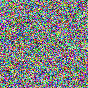

In [92]:
rgb_series_to_image(logistic_map_df['DNA_Encoded_Red'],logistic_map_df['DNA_Encoded_Green'],logistic_map_df['DNA_Encoded_Blue'],output_path="dna_encoded.png")

Save till this work

In [93]:
# logistic_map_df.to_pickle("data.pkl")

load again

In [94]:
# temp_df=pd.read_pickle("data.pkl")
temp_df = logistic_map_df
temp_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,ILM_Z_Scalled,DNA_Encoded_Row_&_column_shuffled_Red,DNA_Encoded_Row_&_column_shuffled_Green,DNA_Encoded_Row_&_column_shuffled_Blue,DNA_Encoded_ILM_X_Scalled,DNA_Encoded_ILM_Y_Scalled,DNA_Encoded_ILM_Z_Scalled,DNA_Encoded_Red,DNA_Encoded_Green,DNA_Encoded_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,193,238,77,102,15,18,148,225,95,242
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,201,229,54,61,136,203,156,109,253,161
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,210,83,151,70,125,127,135,46,232,193
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,104,96,152,98,86,104,61,54,240,95
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,219,93,140,137,56,248,142,101,116,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,221,59,245,52,21,218,136,46,47,188
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,16,137,154,249,245,235,69,124,113,188
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,142,53,165,130,244,160,219,193,5,89
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,194,38,87,61,25,1,151,63,86,170


Diffusion using CML starts here

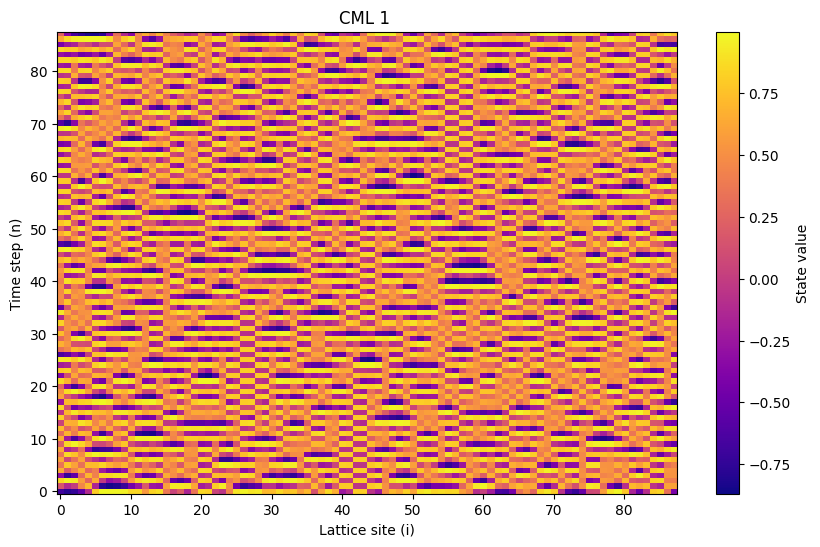

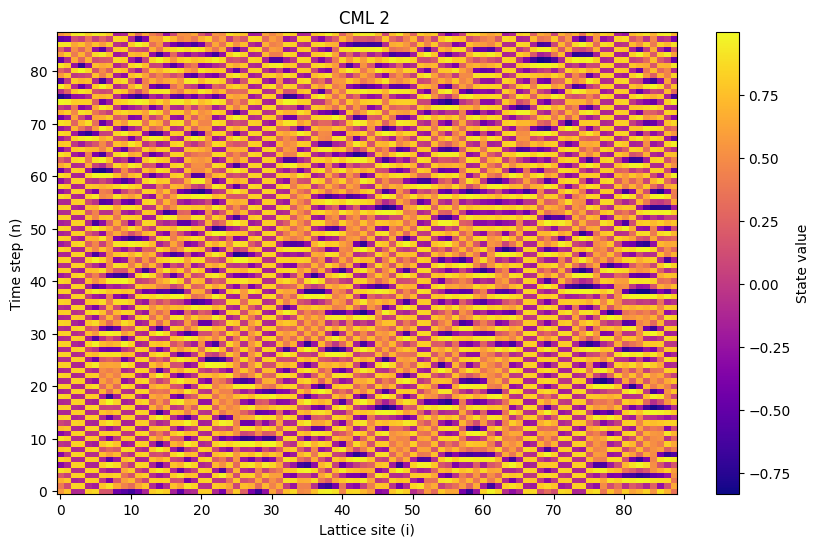

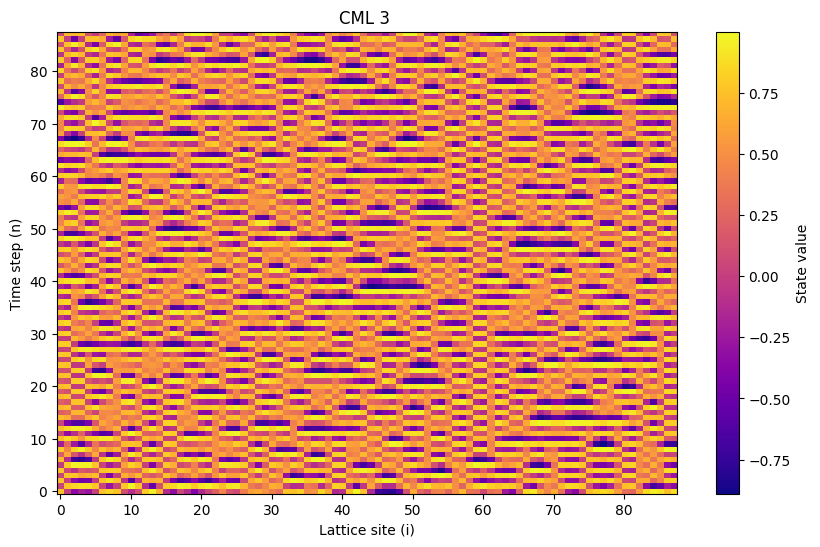

In [95]:
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt

Total_Image_Size = 88*88
img_side = int(math.sqrt(Total_Image_Size))

# ---------------------------
# Logistic Map (for seeds)
# ---------------------------
def chaotic_function(x_n, r=3.9):
    return r * x_n * (1 - x_n)

# Generate chaotic sequence
my_values = []
r = 3.9
x_n = 0.5

for i in range(img_side * 3 + 10000):
    x_n = chaotic_function(x_n, r)
    if i >= 10000:  # burn initial transient
        my_values.append(x_n)

chaotic_df = pd.DataFrame({"value": my_values})

# ---------------------------
# Initial Conditions
# ---------------------------
x = chaotic_df['value'][0:img_side].values
y = chaotic_df['value'][img_side:2*img_side].values
z = chaotic_df['value'][2*img_side:3*img_side].values

# ---------------------------
# Parameters (DIFFERENT for each CML)
# ---------------------------
N = img_side
T = img_side
burn_in = 100  # required burn-in

mu1, eps1 = 1.9, 0.3
mu2, eps2 = 1.85, 0.25
mu3, eps3 = 1.92, 0.35

# ---------------------------
# CML function
# ---------------------------
def run_cml(initial_state, mu, eps):
    x = initial_state.copy()
    
    # Burn-in phase
    for _ in range(burn_in):
        fx = 1 - mu * (x ** 2)
        x_left = np.roll(fx, 1)
        x_right = np.roll(fx, -1)
        x = (1 - eps) * fx + (eps / 2) * (x_left + x_right)

    # Actual evolution storage
    cml = np.zeros((T, N))

    for t in range(T):
        cml[t] = x
        fx = 1 - mu * (x ** 2)
        x_left = np.roll(fx, 1)
        x_right = np.roll(fx, -1)
        x = (1 - eps) * fx + (eps / 2) * (x_left + x_right)

    return cml

# ---------------------------
# Run 3 independent CMLs
# ---------------------------
cml_1st = run_cml(x, mu1, eps1)
cml_2nd = run_cml(y, mu2, eps2)
cml_3rd = run_cml(z, mu3, eps3)

# ---------------------------
# Visualization
# ---------------------------
def plot_cml(cml, title):
    plt.figure(figsize=(10, 6))
    plt.imshow(cml, cmap="plasma", aspect="auto", origin="lower")
    plt.colorbar(label="State value")
    plt.xlabel("Lattice site (i)")
    plt.ylabel("Time step (n)")
    plt.title(title)
    plt.show()

plot_cml(cml_1st, "CML 1 ")
plot_cml(cml_2nd, "CML 2 ")
plot_cml(cml_3rd, "CML 3 ")

In [96]:
print(cml_1st.shape)
print(cml_2nd.shape)
print(cml_3rd.shape)
print(cml_1st)
print(cml_2nd)
print(cml_3rd)

(88, 88)
(88, 88)
(88, 88)
[[-0.68133831 -0.78705587 -0.74377662 ...  0.84417443  0.33180513
  -0.41718891]
 [ 0.15643638 -0.11384402  0.00551563 ... -0.15966507  0.60087116
   0.60483783]
 [ 0.85949685  0.9757793   0.93708014 ...  0.86255387  0.40828193
   0.40357493]
 ...
 [-0.42118483 -0.24388569 -0.16381139 ... -0.66673928 -0.62769311
  -0.66124098]
 [ 0.62249728  0.86268551  0.94117968 ...  0.29473595  0.22467426
   0.25562363]
 [ 0.25389383 -0.35271774 -0.65417045 ...  0.74106635  0.88948294
   0.78826853]]
[[ 0.560054    0.76401647 -0.10701317 ...  0.88736159  0.68502359
   0.35203229]
 [ 0.4011525   0.11490466  0.84700525 ... -0.26831492  0.13815872
   0.64700192]
 [ 0.67686176  0.77856432 -0.15756268 ...  0.88062586  0.86006337
   0.37754898]
 ...
 [ 0.9086601   0.91747527  0.62904571 ...  0.82263682  0.69883673
   0.88894313]
 [-0.5230032  -0.45038309  0.12174395 ... -0.08751641 -0.0168497
  -0.4003009 ]
 [ 0.5365103   0.65187082  0.93222645 ...  0.93729981  0.96077921
   0.7

In [97]:
cml_1st_values=[]; cml_2nd_values=[];cml_3rd_values=[]; 
# iterations=[]
for i in range(cml_1st.shape[0]):
    for j in range(cml_1st.shape[1]):
        # iterations.append((i*img_side+j))
        cml_1st_values.append(cml_1st[i][j])
        cml_2nd_values.append(cml_2nd[i][j])
        cml_3rd_values.append(cml_3rd[i][j])

print(len(cml_1st_values))
print(len(cml_2nd_values))
print(len(cml_3rd_values))

# cml_1st_values_df=pd.DataFrame()
# cml_2nd_values_df=pd.DataFrame()
# cml_3rd_values_df=pd.DataFrame()
# cml_1st_values_df["iterations"]=iterations
# cml_2nd_values_df["iterations"]=iterations
# cml_3rd_values_df["iterations"]=iterations
# cml_1st_values_df['values']=cml_1st_values
# cml_2nd_values_df['values']=cml_2nd_values
# cml_3rd_values_df['values']=cml_3rd_values
# print(cml_1st_values_df)
# print(cml_2nd_values_df)
# print(cml_3rd_values_df)

logistic_map_df['CML_1']=cml_1st_values
logistic_map_df['CML_2']=cml_2nd_values
logistic_map_df['CML_3']=cml_3rd_values
logistic_map_df


7744
7744
7744


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,DNA_Encoded_Row_&_column_shuffled_Blue,DNA_Encoded_ILM_X_Scalled,DNA_Encoded_ILM_Y_Scalled,DNA_Encoded_ILM_Z_Scalled,DNA_Encoded_Red,DNA_Encoded_Green,DNA_Encoded_Blue,CML_1,CML_2,CML_3
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,102,15,18,148,225,95,242,-0.681338,0.560054,0.749718
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,61,136,203,156,109,253,161,-0.787056,0.764016,-0.009491
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,70,125,127,135,46,232,193,-0.743777,-0.107013,-0.340830
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,98,86,104,61,54,240,95,-0.536977,-0.095744,-0.207641
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,137,56,248,142,101,116,7,-0.104818,0.819217,-0.279948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,52,21,218,136,46,47,188,0.852920,0.918595,-0.367327
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,249,245,235,69,124,113,188,0.370373,0.685962,0.082915
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,130,244,160,219,193,5,89,0.741066,0.937300,0.794565
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,61,25,1,151,63,86,170,0.889483,0.960779,0.783438


In [98]:
import pandas as pd
import numpy as np

def normalize_series_to_uint8(series):
    min_val = series.min()
    max_val = series.max()

    # Handle edge case (all values same)
    if max_val == min_val:
        return pd.Series(np.zeros(len(series), dtype=np.uint8), index=series.index)

    normalized = (series - min_val) / (max_val - min_val)
    scaled = (normalized * 255).astype(np.uint8)

    return scaled

logistic_map_df['CML_1_Normalized']=normalize_series_to_uint8(logistic_map_df['CML_1'])
logistic_map_df['CML_2_Normalized']=normalize_series_to_uint8(logistic_map_df['CML_2'])
logistic_map_df['CML_3_Normalized']=normalize_series_to_uint8(logistic_map_df['CML_3'])
logistic_map_df


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,DNA_Encoded_ILM_Z_Scalled,DNA_Encoded_Red,DNA_Encoded_Green,DNA_Encoded_Blue,CML_1,CML_2,CML_3,CML_1_Normalized,CML_2_Normalized,CML_3_Normalized
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,148,225,95,242,-0.681338,0.560054,0.749718,25,193,221
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,156,109,253,161,-0.787056,0.764016,-0.009491,11,222,118
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,135,46,232,193,-0.743777,-0.107013,-0.340830,17,100,74
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,61,54,240,95,-0.536977,-0.095744,-0.207641,45,102,92
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,142,101,116,7,-0.104818,0.819217,-0.279948,104,229,82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,136,46,47,188,0.852920,0.918595,-0.367327,235,243,70
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,69,124,113,188,0.370373,0.685962,0.082915,169,211,131
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,219,193,5,89,0.741066,0.937300,0.794565,219,246,227
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,151,63,86,170,0.889483,0.960779,0.783438,240,249,225


In [99]:
logistic_map_df['Diffused_Red']=logistic_map_df['DNA_Encoded_Red']^logistic_map_df['CML_1_Normalized']
logistic_map_df['Diffused_Green']=logistic_map_df['DNA_Encoded_Green']^logistic_map_df['CML_2_Normalized']
logistic_map_df['Diffused_Blue']=logistic_map_df['DNA_Encoded_Blue']^logistic_map_df['CML_3_Normalized']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,DNA_Encoded_Blue,CML_1,CML_2,CML_3,CML_1_Normalized,CML_2_Normalized,CML_3_Normalized,Diffused_Red,Diffused_Green,Diffused_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,242,-0.681338,0.560054,0.749718,25,193,221,248,158,47
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,161,-0.787056,0.764016,-0.009491,11,222,118,102,35,215
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,193,-0.743777,-0.107013,-0.340830,17,100,74,63,140,139
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,95,-0.536977,-0.095744,-0.207641,45,102,92,27,150,3
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,7,-0.104818,0.819217,-0.279948,104,229,82,13,145,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,188,0.852920,0.918595,-0.367327,235,243,70,197,220,250
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,188,0.370373,0.685962,0.082915,169,211,131,213,162,63
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,89,0.741066,0.937300,0.794565,219,246,227,26,243,186
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,170,0.889483,0.960779,0.783438,240,249,225,207,175,75


Image saved as difiused.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_4528\2431491163.py:31: DeprecationWarning:

'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)



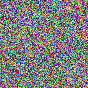

In [100]:
rgb_series_to_image(logistic_map_df['Diffused_Red'],logistic_map_df['Diffused_Green'],logistic_map_df['Diffused_Blue'],output_path="difiused.png")

Decryption

In [101]:
logistic_map_df['Decrypted_Red']=logistic_map_df['Diffused_Red']^logistic_map_df['CML_1_Normalized']
logistic_map_df['Decrypted_Green']=logistic_map_df['Diffused_Green']^logistic_map_df['CML_2_Normalized']
logistic_map_df['Decrypted_Blue']=logistic_map_df['Diffused_Blue']^logistic_map_df['CML_3_Normalized']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,CML_3,CML_1_Normalized,CML_2_Normalized,CML_3_Normalized,Diffused_Red,Diffused_Green,Diffused_Blue,Decrypted_Red,Decrypted_Green,Decrypted_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,0.749718,25,193,221,248,158,47,225,95,242
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,-0.009491,11,222,118,102,35,215,109,253,161
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,-0.340830,17,100,74,63,140,139,46,232,193
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,-0.207641,45,102,92,27,150,3,54,240,95
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,-0.279948,104,229,82,13,145,85,101,116,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,-0.367327,235,243,70,197,220,250,46,47,188
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,0.082915,169,211,131,213,162,63,124,113,188
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,0.794565,219,246,227,26,243,186,193,5,89
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,0.783438,240,249,225,207,175,75,63,86,170


In [102]:
def decrypt_dna_encode(decrypted_dna_encoded_number,rule_number):
    decrypted_dna_encoded_binary_pairs=pixel_number_to_binary_pairs(decrypted_dna_encoded_number)    
    decrypted_dna_encode = [DNA_code[e]    for e in decrypted_dna_encoded_binary_pairs]
    decrypted_binary_pairs = [DNA_Encoding_Rules[rule_number][e] for e in decrypted_dna_encode]
    #used just for printing
    decrypted_dna_code = [DNA_code[e] for e in decrypted_binary_pairs]
    ##
    decrypted_binary_number = "".join(decrypted_binary_pairs)
    decrypted_pixel_number = int(decrypted_binary_number,2)
    print(decrypted_pixel_number,"<---",decrypted_binary_number,"<---",decrypted_binary_pairs,"||||",decrypted_dna_code,"||||<---",decrypted_dna_encode,"<---",decrypted_dna_encoded_binary_pairs,"<----",decrypted_dna_encoded_number,)
    return decrypted_pixel_number

In [103]:
logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Red']= logistic_map_df['DNA_Encoded_Red']^logistic_map_df['DNA_Encoded_ILM_X_Scalled']#ILM X  Scalled can be re-buil using the same 3d intertwin logistic map (same key)
logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Green']= logistic_map_df['DNA_Encoded_Green']^logistic_map_df['DNA_Encoded_ILM_Y_Scalled']#ILM Z  Scalled can be re-buil using the same 3d intertwin logistic map (same key)
logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Blue']= logistic_map_df['DNA_Encoded_Blue']^logistic_map_df['DNA_Encoded_ILM_Z_Scalled']#ILM Y Scalled can be re-buil using the same 3d intertwin logistic map (same key)

logistic_map_df['Decrypted_Row_&_column_shuffled_Red']=logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Red'].apply(lambda x : decrypt_dna_encode(x,rule_number))
logistic_map_df['Decrypted_Row_&_column_shuffled_Green']=logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Green'].apply(lambda x : decrypt_dna_encode(x,rule_number))
logistic_map_df['Decrypted_Row_&_column_shuffled_Blue']=logistic_map_df['Decrypted_DNA_Encoded_Row_&_column_shuffled_Blue'].apply(lambda x : decrypt_dna_encode(x,rule_number))


187 <--- 10111011 <--- ['10', '11', '10', '11'] |||| ['G', 'T', 'G', 'T'] ||||<--- ['T', 'G', 'T', 'G'] <--- ['11', '10', '11', '10'] <---- 238
176 <--- 10110000 <--- ['10', '11', '00', '00'] |||| ['G', 'T', 'A', 'A'] ||||<--- ['T', 'G', 'C', 'C'] <--- ['11', '10', '01', '01'] <---- 229
6 <--- 00000110 <--- ['00', '00', '01', '10'] |||| ['A', 'A', 'C', 'G'] ||||<--- ['C', 'C', 'A', 'T'] <--- ['01', '01', '00', '11'] <---- 83
53 <--- 00110101 <--- ['00', '11', '01', '01'] |||| ['A', 'T', 'C', 'C'] ||||<--- ['C', 'G', 'A', 'A'] <--- ['01', '10', '00', '00'] <---- 96
8 <--- 00001000 <--- ['00', '00', '10', '00'] |||| ['A', 'A', 'G', 'A'] ||||<--- ['C', 'C', 'T', 'C'] <--- ['01', '01', '11', '01'] <---- 93
177 <--- 10110001 <--- ['10', '11', '00', '01'] |||| ['G', 'T', 'A', 'C'] ||||<--- ['T', 'G', 'C', 'A'] <--- ['11', '10', '01', '00'] <---- 228
236 <--- 11101100 <--- ['11', '10', '11', '00'] |||| ['T', 'G', 'T', 'A'] ||||<--- ['G', 'T', 'G', 'C'] <--- ['10', '11', '10', '01'] <---- 185


In [104]:
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Diffused_Blue,Decrypted_Red,Decrypted_Green,Decrypted_Blue,Decrypted_DNA_Encoded_Row_&_column_shuffled_Red,Decrypted_DNA_Encoded_Row_&_column_shuffled_Green,Decrypted_DNA_Encoded_Row_&_column_shuffled_Blue,Decrypted_Row_&_column_shuffled_Red,Decrypted_Row_&_column_shuffled_Green,Decrypted_Row_&_column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,47,225,95,242,238,77,102,187,24,51
1,10001,0.891768,0.743097,0.382533,227,189,98,10,10,10,...,215,109,253,161,229,54,61,176,99,104
2,10002,0.611545,0.247348,0.078047,156,63,20,39,39,39,...,139,46,232,193,83,151,70,6,194,19
3,10003,0.492953,0.616256,0.791442,126,157,202,48,48,48,...,3,54,240,95,96,152,98,53,205,55
4,10004,0.417638,0.898408,0.172082,106,229,44,47,47,47,...,85,101,116,7,93,140,137,8,217,220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,56,56,56,...,250,46,47,188,59,245,52,110,160,97
7740,17740,0.932606,0.303221,0.687324,238,77,175,57,57,57,...,63,124,113,188,137,154,249,220,207,172
7741,17741,0.540453,0.108469,0.786355,138,28,201,57,57,57,...,186,193,5,89,53,165,130,96,240,215
7742,17742,0.745769,0.115407,0.339577,190,29,87,57,57,57,...,75,63,86,170,38,87,61,115,2,104


--user will get the row shuffled cipher matrix(from row shuffled image)
--similar chaotic matrix (from secret key)
--similar row_shuffling_sorted_indices(from similar chaotic matrix)
--similar column_shuffling_sorted_indices(from similar chaotic matrix)
--similar logistic_map_df (from secret keys)

In [105]:
row_shuffled_cipher_matrix
chaotic_matrix
row_shuffling_sorted_indices
column_shuffling_sorted_indices

array([[[ 0.09535158,  1.        ,  0.        ],
        [ 0.0952068 , 40.        ,  1.        ],
        [ 0.0950625 ,  0.        ,  2.        ],
        ...,
        [ 0.0951902 , 45.        , 85.        ],
        [ 0.09545112, 33.        , 86.        ],
        [ 0.09513463, 21.        , 87.        ]],

       [[ 0.09603456, 45.        ,  0.        ],
        [ 0.09546531, 55.        ,  1.        ],
        [ 0.09506309, 28.        ,  2.        ],
        ...,
        [ 0.09633118, 84.        , 85.        ],
        [ 0.10334437, 52.        , 86.        ],
        [ 0.0951878 , 73.        , 87.        ]],

       [[ 0.09634294, 69.        ,  0.        ],
        [ 0.09556822, 63.        ,  1.        ],
        [ 0.09882993, 37.        ,  2.        ],
        ...,
        [ 0.09666052, 59.        , 85.        ],
        [ 0.10395971, 37.        , 86.        ],
        [ 0.095314  ,  7.        , 87.        ]],

       ...,

       [[ 0.97486349, 63.        ,  0.        ],
        [ 0

Reverse_row_shuffling on row_shuffled_matrix

In [106]:
reverse_row_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(reverse_row_shuffled_cipher_matrix.shape)
print(reverse_row_shuffled_cipher_matrix)

for row in range(row_shuffling_sorted_indices.shape[0]):
    for col in range(row_shuffling_sorted_indices.shape[1]):
        #row_shuffling sorted_indes is storing the original postion of each cell (just place it back )
        original_row=int(row_shuffling_sorted_indices[row][col][1])
        original_col=int(row_shuffling_sorted_indices[row][col][2])
        print(f"current_row:{row} -> Original_row : {original_row};;;; current_col:{col} -> original_col: {original_col}")
        reverse_row_shuffled_cipher_matrix[original_row][original_col]=row_shuffled_cipher_matrix[row][col]
decrypted_column_shuffled_cipher_matrix=reverse_row_shuffled_cipher_matrix
print(decrypted_column_shuffled_cipher_matrix.shape)
decrypted_column_shuffled_cipher_matrix

(88, 88, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
current_row:0 -> Original_row : 0;;;; current_col:0 -> original_col: 2
current_row:0 -> Original_row : 0;;;; current_col:1 -> original_col: 45
current_row:0 -> Original_row : 0;;;; current_col:2 -> original_col: 69
current_row:0 -> Original_row : 0;;;; current_col:3 -> original_col: 31
current_row:0 -> Original_row : 0;;;; current_col:4 -> original_col: 10
current_row:0 -> Original_row : 0;;;; current_col:5 -> original_col: 24
current_row:0 -> Original_row : 0;;;; current_col:6 -> original_col: 78
current_row:0 -> Original_row : 0;;;; current_col:7 -> original_col: 59

array([[[146, 134,  93],
        [242, 139, 116],
        [187,  24,  51],
        ...,
        [220,  68,   7],
        [ 77,  83, 124],
        [ 93, 248, 205]],

       [[113, 165, 168],
        [ 44, 189, 243],
        [225, 190, 128],
        ...,
        [ 61, 173, 163],
        [ 90,  57, 164],
        [104,  11, 192]],

       [[195,  25, 208],
        [110, 114, 121],
        [ 87,  38, 150],
        ...,
        [ 80,  21,   3],
        [ 76, 141,   5],
        [ 22, 176, 156]],

       ...,

       [[ 85,  24, 110],
        [193,  22,  43],
        [184,  99, 225],
        ...,
        [133,  19, 113],
        [ 76,  99, 111],
        [219, 141, 202]],

       [[175,  10, 146],
        [247,  80, 187],
        [152, 187, 249],
        ...,
        [  7, 197, 123],
        [212,  20, 140],
        [ 55, 120, 212]],

       [[206, 127, 164],
        [233, 183, 104],
        [212,  44, 171],
        ...,
        [ 22, 144, 136],
        [151,  77, 224],
        [ 96, 112,  78]]

Reverse Column shuffling on decrypted_column_shuffled_cipher_matrix

In [107]:
# decrypted_column_shuffled_cipher_matrix
reverse_column_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(reverse_column_shuffled_cipher_matrix.shape)
print(reverse_column_shuffled_cipher_matrix)

for row in range(column_shuffling_sorted_indices.shape[0]):
    for col in range(column_shuffling_sorted_indices.shape[1]):
        #column_shuffling sorted_indes is storing the original postion of each cell (just place it back )
        original_row=int(column_shuffling_sorted_indices[row][col][1])
        original_col=int(column_shuffling_sorted_indices[row][col][2])
        print(f"current_row:{row} -> Original_row : {original_row};;;; current_col:{col} -> original_col: {original_col}")
        reverse_column_shuffled_cipher_matrix[original_row][original_col]=decrypted_column_shuffled_cipher_matrix[row][col]
decrypted_cipher_matrix=reverse_column_shuffled_cipher_matrix
print(decrypted_cipher_matrix.shape)
decrypted_cipher_matrix

(88, 88, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
current_row:0 -> Original_row : 1;;;; current_col:0 -> original_col: 0
current_row:0 -> Original_row : 40;;;; current_col:1 -> original_col: 1
current_row:0 -> Original_row : 0;;;; current_col:2 -> original_col: 2
current_row:0 -> Original_row : 47;;;; current_col:3 -> original_col: 3
current_row:0 -> Original_row : 59;;;; current_col:4 -> original_col: 4
current_row:0 -> Original_row : 6;;;; current_col:5 -> original_col: 5
current_row:0 -> Original_row : 4;;;; current_col:6 -> original_col: 6
current_row:0 -> Original_row : 35;;;; current_col:7 -> original_col: 7
cu

array([[[ 92,  66, 200],
        [233, 183, 104],
        [187,  24,  51],
        ...,
        [173, 235, 188],
        [187, 185,  48],
        [ 96, 112,  78]],

       [[146, 134,  93],
        [188, 143,  77],
        [ 10, 192,  29],
        ...,
        [ 35,  76, 188],
        [ 40,  10,  92],
        [116,  87, 227]],

       [[246,  15, 214],
        [ 17, 219, 214],
        [242, 198, 196],
        ...,
        [130,  71, 116],
        [ 51,  88, 224],
        [198, 150,  17]],

       ...,

       [[149,  99,  13],
        [ 57, 129,   3],
        [220, 253, 208],
        ...,
        [152, 128, 192],
        [249, 106,  52],
        [ 12, 106, 242]],

       [[199, 248,  72],
        [154,  27, 207],
        [181,  26, 186],
        ...,
        [190, 238, 177],
        [ 87, 129, 103],
        [183, 244, 148]],

       [[234,   7,  53],
        [ 29, 124,  48],
        [115, 210,  35],
        ...,
        [179,  37, 240],
        [135,  36, 110],
        [ 86,  89, 195]]

Re-Calculated logistic map using similar inintial conditions and control parameters

In [108]:
#initial parameters (have exact values as referred in the paper see fig 1a in JISA paper)
x_n = 0.361
y_n=0.259
z_n= 0.785
#constants used in the given equation 
mue=3.999
k1=34.913
k2=38.942
k3=36.709

In [109]:
steps=[]; x_values=[] ; y_values= []; z_values = [] 

for i in range((img_rows*img_columns)+ 10000):#initial 10000 iterations are transient iterations (its values are not used)
    #store current values (Keystream)
    if(i<10000):
        continue
    steps.append(i)
    x_values.append(x_n)
    y_values.append(y_n)
    z_values.append(z_n)
    #update keystream
    x_n_plus_1 , y_n_plus_1 , z_n_plus_1 = intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3)
    x_n=x_n_plus_1
    y_n=y_n_plus_1
    z_n=z_n_plus_1
#dataframe creation
import pandas as pd
logistic_map_df_in_decryption=pd.DataFrame()
logistic_map_df_in_decryption["Steps"]=steps
logistic_map_df_in_decryption["X"]=x_values
logistic_map_df_in_decryption["Y"]=y_values
logistic_map_df_in_decryption["Z"]=z_values

print(logistic_map_df_in_decryption["X"].max())
print(logistic_map_df_in_decryption["Y"].max())
print(logistic_map_df_in_decryption["Z"].max())
print(logistic_map_df_in_decryption["X"].min())
print(logistic_map_df_in_decryption["Y"].min())
print(logistic_map_df_in_decryption["Z"].min())
logistic_map_df_in_decryption

0.9999500084923696
0.9999464846033206
0.9998946894031064
0.0001903313549238561
0.00023092870618768302
2.8339175358382818e-05


,Steps,X,Y,Z
0,10000,0.361000,0.259000,0.785000
1,10001,0.891768,0.743097,0.382533
2,10002,0.611545,0.247348,0.078047
3,10003,0.492953,0.616256,0.791442
4,10004,0.417638,0.898408,0.172082
...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928
7740,17740,0.932606,0.303221,0.687324
7741,17741,0.540453,0.108469,0.786355
7742,17742,0.745769,0.115407,0.339577


In [110]:
# logistic_map_df_in_decryption['Steps'] = logistic_map_df_in_decryption['Steps']
#Note all values from the itertwined logistic maps are btw [0,1]
# All logistic values are scalled to be in btw [0,255] 
logistic_map_df_in_decryption['X_Scalled'] = (logistic_map_df_in_decryption['X'] * 255).round().astype(int)
logistic_map_df_in_decryption['Y_Scalled'] = (logistic_map_df_in_decryption["Y"] * 255).round().astype(int)
logistic_map_df_in_decryption['Z_Scalled'] = (logistic_map_df_in_decryption["Z"] * 255).round().astype(int)

print(logistic_map_df_in_decryption['X_Scalled'].max())
print(logistic_map_df_in_decryption['Y_Scalled'].max())
print(logistic_map_df_in_decryption['Z_Scalled'].max())
print(logistic_map_df_in_decryption['X_Scalled'].min())
print(logistic_map_df_in_decryption['Y_Scalled'].min())
print(logistic_map_df_in_decryption['Z_Scalled'].min())
logistic_map_df_in_decryption


255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled
0,10000,0.361000,0.259000,0.785000,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44
...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206
7740,17740,0.932606,0.303221,0.687324,238,77,175
7741,17741,0.540453,0.108469,0.786355,138,28,201
7742,17742,0.745769,0.115407,0.339577,190,29,87


In [111]:
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(decrypted_cipher_matrix.shape[0]):#Rows in decrypted_cipher_matrix matrix
    for column in range(decrypted_cipher_matrix.shape[1]):#columns in decrypted_cipher_matrix matrix
        red_values.append(decrypted_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(decrypted_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(decrypted_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
logistic_map_df_in_decryption["cipher_Red"]=red_values
logistic_map_df_in_decryption["cipher_Green"]=green_values
logistic_map_df_in_decryption["cipher_Blue"]=blue_values
logistic_map_df_in_decryption

7744
7744
7744


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,cipher_Red,cipher_Green,cipher_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98,233,183,104
2,10002,0.611545,0.247348,0.078047,156,63,20,187,24,51
3,10003,0.492953,0.616256,0.791442,126,157,202,78,173,250
4,10004,0.417638,0.898408,0.172082,106,229,44,69,202,3
...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,106,51,246
7740,17740,0.932606,0.303221,0.687324,238,77,175,215,116,150
7741,17741,0.540453,0.108469,0.786355,138,28,201,179,37,240
7742,17742,0.745769,0.115407,0.339577,190,29,87,135,36,110


In [112]:
logistic_map_df_in_decryption["decrypt_Red"]=logistic_map_df_in_decryption["cipher_Red"]^logistic_map_df_in_decryption["X_Scalled"]
logistic_map_df_in_decryption["decrypt_Green"]=logistic_map_df_in_decryption["cipher_Green"]^logistic_map_df_in_decryption["Y_Scalled"]
logistic_map_df_in_decryption["decrypt_Blue"]=logistic_map_df_in_decryption["cipher_Blue"]^logistic_map_df_in_decryption["Z_Scalled"]
logistic_map_df_in_decryption

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,cipher_Red,cipher_Green,cipher_Blue,decrypt_Red,decrypt_Green,decrypt_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,233,183,104,10,10,10
2,10002,0.611545,0.247348,0.078047,156,63,20,187,24,51,39,39,39
3,10003,0.492953,0.616256,0.791442,126,157,202,78,173,250,48,48,48
4,10004,0.417638,0.898408,0.172082,106,229,44,69,202,3,47,47,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,17739,0.322693,0.043618,0.807928,82,11,206,106,51,246,56,56,56
7740,17740,0.932606,0.303221,0.687324,238,77,175,215,116,150,57,57,57
7741,17741,0.540453,0.108469,0.786355,138,28,201,179,37,240,57,57,57
7742,17742,0.745769,0.115407,0.339577,190,29,87,135,36,110,57,57,57


Testing

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import math

def rgb_series_to_image(R, G, B, save_path="encrypted1.png"):
    # Convert to numpy arrays
    R = np.array(R, dtype=np.uint8)
    G = np.array(G, dtype=np.uint8)
    B = np.array(B, dtype=np.uint8)
    
    n = len(R)
    size = int(math.sqrt(n))
    
    if size * size != n:
        raise ValueError("Length must be perfect square")
    
    R = R.reshape((size, size))
    G = G.reshape((size, size))
    B = B.reshape((size, size))
    
    img = np.stack((R, G, B), axis=2)
    
    Image.fromarray(img).save(save_path)
    return img

# Example usage:
test_img = rgb_series_to_image(logistic_map_df['Diffused_Red'],logistic_map_df['Diffused_Green'],logistic_map_df['Diffused_Blue'])

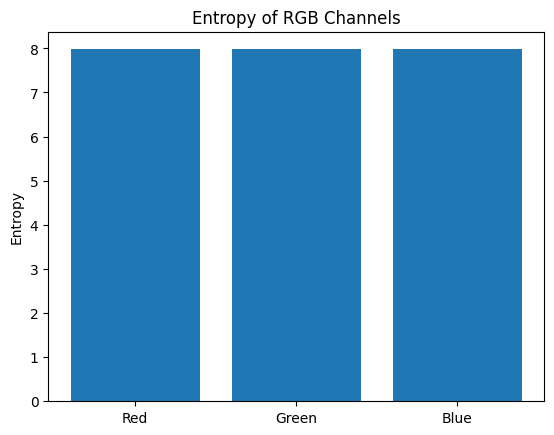

In [114]:
import numpy as np
import matplotlib.pyplot as plt

def calculate_entropy(channel):
    hist, _ = np.histogram(channel.flatten(), bins=256, range=(0,255))
    prob = hist / np.sum(hist)
    prob = prob[prob > 0]
    entropy = -np.sum(prob * np.log2(prob))
    return entropy

def plot_entropy(img):
    entropies = [
        calculate_entropy(img[:,:,0]),
        calculate_entropy(img[:,:,1]),
        calculate_entropy(img[:,:,2])
    ]
    
    labels = ['Red', 'Green', 'Blue']
    
    plt.figure()
    plt.bar(labels, entropies)
    plt.title("Entropy of RGB Channels")
    plt.ylabel("Entropy")
    plt.savefig("entropy_plot.png")
    plt.show()

plot_entropy(test_img)

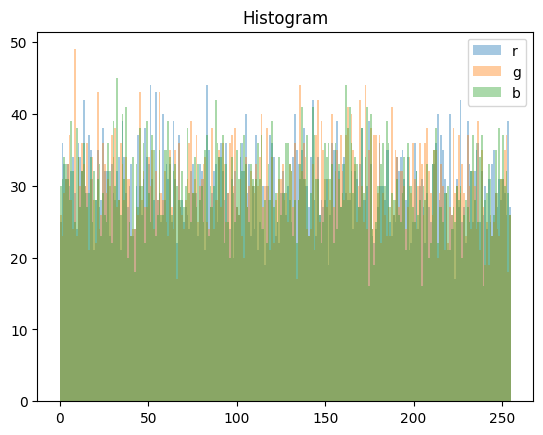

In [115]:
def histogram_plot(img):
    plt.figure()
    colors = ['r','g','b']
    
    for i,c in enumerate(colors):
        plt.hist(img[:,:,i].flatten(), bins=256, alpha=0.4, label=c)
    
    plt.legend()
    plt.title("Histogram")
    plt.savefig("histogram.png")
    plt.show()

histogram_plot(test_img)

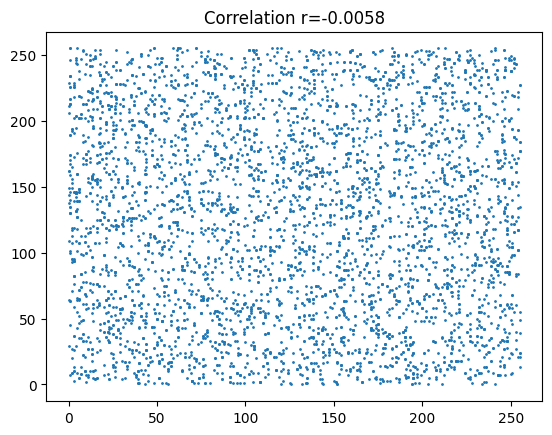

Correlation: -0.005790088139290161


In [116]:
import random

def correlation_plot(img):
    ch = img[:,:,0]  # use red channel
    
    x, y = [], []
    for _ in range(5000):
        i = random.randint(0, ch.shape[0]-2)
        j = random.randint(0, ch.shape[1]-2)
        
        x.append(ch[i,j])
        y.append(ch[i,j+1])
    
    x, y = np.array(x), np.array(y)
    
    corr = np.corrcoef(x, y)[0,1]
    
    plt.figure()
    plt.scatter(x, y, s=1)
    plt.title(f"Correlation r={corr:.4f}")
    plt.savefig("correlation.png")
    plt.show()
    
    print("Correlation:", corr)

correlation_plot(test_img)

In [117]:
import matplotlib.pyplot as plt

def plot_rgb_histograms(img):
    channels = ['Red', 'Green', 'Blue']
    filenames = ['hist_red.png', 'hist_green.png', 'hist_blue.png']
    
    for i in range(3):
        plt.figure()
        plt.hist(img[:,:,i].flatten(), bins=256)
        plt.title(f"{channels[i]} Channel Histogram")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.savefig(filenames[i])
        plt.close()   # important: prevents overlap
        
    print("Saved: hist_red.png, hist_green.png, hist_blue.png")

plot_rgb_histograms(test_img)

Saved: hist_red.png, hist_green.png, hist_blue.png


In [118]:
import matplotlib.pyplot as plt

def plot_rgb_histograms(img):
    channels = ['Red', 'Green', 'Blue']
    colors = ['red', 'green', 'blue']
    filenames = ['hist_red.png', 'hist_green.png', 'hist_blue.png']
    
    for i in range(3):
        plt.figure()
        plt.hist(
            img[:,:,i].flatten(),
            bins=256,
            color=colors[i],
            alpha=0.8
        )
        
        plt.title(f"{channels[i]} Channel Histogram")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        
        plt.savefig(filenames[i])
        plt.close()
    
    print("Saved colored histograms!")

plot_rgb_histograms(test_img)

Saved colored histograms!
